In [45]:
import os
import numpy as np
import pandas as pd
import ast
from scipy.stats import iqr,yeojohnson, skew, kurtosis
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import missingno as msno

import regex as re
import eda_helper_functions
import matplotlib.gridspec as gridspec
import scipy.stats as stats
from collections import defaultdict
from scipy.stats import ttest_ind

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.impute import SimpleImputer

import warnings
warnings.filterwarnings("ignore")

In [46]:
df = pd.read_csv('3rd_after_multivariate_analysis_dataset.csv')

In [47]:
df.shape

(11889, 46)

In [4]:
#let's see if our dataset contains missing values.

df.isna().sum().sum()

112572

`observation`
- 112572 is a big number that tells us there are a lot of missing values in dataset

In [5]:
# Null Values Analysis
def null_features(df):
    # Prepare dataset EDA values
    summary = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name', 'dtypes']]
    summary['Uniques'] = df.nunique().values
    summary['Null'] = df.isna().sum().values
    summary['Null(%)'] = round((summary['Null'] / len(df) * 100), 1).astype(str) + '%'
    
    # Add a column to indicate whether the feature has missing values
    summary['Has Null'] = summary['Null'] > 0

    # Sort by Null count (descending) and Name (ascending)
    summary = summary.sort_values(by=['Null', 'Name'], ascending=[False, True])
    summary.index = range(1, len(summary) + 1)
    
    return summary

# Example usage
#null_summary = null_features(df)
#print(null_summary)
null_features(df)

,Name,dtypes,Uniques,Null,Null(%),Has Null
1,tourist,object,16,10341,86.9%,True
2,hospital,object,56,8595,72.3%,True
3,parking,float64,10,6232,52.4%,True
4,transport,object,144,6074,51.1%,True
5,balcony,float64,8,5820,48.9%,True
6,project_in_acres,float64,205,5776,48.6%,True
7,lift,float64,10,5439,45.7%,True
8,extra_rooms,object,16,5296,44.5%,True
9,available_units,float64,589,5218,43.9%,True
10,commercial_hub,object,134,5138,43.2%,True


# User-Defined Functions

`Null value analysis`

In [6]:
# Null Values Analysis
def null_features(data):
    # Prepare dataset EDA values
    summary = pd.DataFrame(data.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name', 'dtypes']]
    summary['Uniques'] = data.nunique().values
    summary['Null'] = data.isna().sum().values
    summary['Null(%)'] = round((summary['Null'] / len(data) * 100), 1).astype(str) + '%'
    
    # Add a column to indicate whether the feature has missing values
    summary['Has Null'] = summary['Null'] > 0

    # Sort by Null count (descending) and Name (ascending)
    summary = summary.sort_values(by=['Null', 'Name'], ascending=[False, True])
    summary.index = range(1, len(summary) + 1)
    
    return summary

# Example usage
#null_summary = null_features(data)
#print(null_summary)

`Categorization of Hidden Patterns in Missing Data Using Correlation Matrix Analysis`

In [7]:
def categorize_missingness(corr_matrix):
    categories = {
        "exact 1.00 means always Missing Together": defaultdict(list),
        "less than 1.00 but greater than equal to 0.7 means highly Likely to be Missing Together": defaultdict(list),
        "less than 0.7 but greater than equal to 0.4 means moderately Related Missingness": defaultdict(list),
        "less than 0.4 but greater than equal to 0.1 means occasionally Missing Together": defaultdict(list),
        "less than -0.7 means one Present, one Always Missing": defaultdict(list),
        "less than -0.4 but greater than equal to -0.7 means highly Opposite Missingness": defaultdict(list),
        "less than -0.1 but greater than equal to -0.4 means slightly Opposite Missingness": defaultdict(list),
        "between -0.1 and 0.1 means unrelated Missingness": defaultdict(list)
    }

    processed_pairs = set()

    for col in corr_matrix.columns:
        for index, corr_value in corr_matrix[col].items():
            if col != index and (index, col) not in processed_pairs:
                processed_pairs.add((col, index))  # Mark as processed to avoid duplicates

                if corr_value == 1.0:
                    categories["exact 1.00 means always Missing Together"][col].append(index)
                elif corr_value >= 0.7:
                    categories["less than 1.00 but greater than equal to 0.7 means highly Likely to be Missing Together"][col].append(index)
                elif corr_value >= 0.4:
                    categories["less than 0.7 but greater than equal to 0.4 means moderately Related Missingness"][col].append(index)
                elif corr_value >= 0.1:
                    categories["less than 0.4 but greater than equal to 0.1 means occasionally Missing Together"][col].append(index)
                elif corr_value <= -0.7:
                    categories["less than -0.7 means one Present, one Always Missing"][col].append(index)
                elif corr_value <= -0.4:
                    categories["less than -0.4 but greater than equal to -0.7 means highly Opposite Missingness"][col].append(index)
                elif corr_value <= -0.1:
                    categories["less than -0.1 but greater than equal to -0.4 means slightly Opposite Missingness"][col].append(index)
                else:
                    categories["between -0.1 and 0.1 means unrelated Missingness"][col].append(index)

    return categories

# Compute missing value correlation matrix
missing_corr_matrix = df.isnull().corr()

`t-tests on specific variables test`

In [8]:
def analyze_missing_column(X_train, column):
    """Analyzes missing vs. non-missing groups for a given column and sorts absolute differences."""
    
    # Split data
    missing_data = X_train[X_train[column].isnull()]
    not_missing_data = X_train[~X_train[column].isnull()]
    
    # Calculate means for numeric columns
    means_missing = missing_data.select_dtypes(include=['number']).mean()
    means_not_missing = not_missing_data.select_dtypes(include=['number']).mean()
    
    # Compute absolute differences
    mean_differences = abs(means_missing - means_not_missing)
    
    # Sort differences in descending order
    sorted_differences = mean_differences.sort_values(ascending=False)
    
    print(f"Means with '{column}' missing:\n", means_missing)
    print(f"\nMeans without '{column}' missing:\n", means_not_missing)
    print(f"\nAbsolute Differences (Sorted):\n", sorted_differences)

# Example Usage
# analyze_missing_column(X_train, 'parking')

In [9]:
def analyze_missing_column_with_predictors(X_train, column, test_columns, alpha=0.05):
    """Performs t-tests between missing and non-missing groups using up to 4 predictor columns."""
    
    # Split data
    missing_data = X_train[X_train[column].isnull()]
    not_missing_data = X_train[~X_train[column].isnull()]
    
    for test_col in test_columns:
        if test_col in X_train.columns:
            t_stat, p_val = ttest_ind(
                missing_data[test_col], not_missing_data[test_col], 
                equal_var=False, nan_policy='omit'
            )
            print(f"\nT-test for {test_col}:")
            print(f"T-statistic: {t_stat}, P-value: {p_val}")
            
            if p_val < alpha:
                print(f"{test_col} is significantly different between missing and non-missing groups of '{column}', so '{column}' is likely MAR.")
            else:
                print(f"{test_col} is NOT significantly different, so '{column}' is likely MCAR.")
        else:
            print(f"\nWarning: Column '{test_col}' not found in dataset.")

# Analyze parking column with 4 predictor variables
# analyze_missing_column_with_predictors(X_train, 'parking', ['area', 'locality_rank', 'costpersqft', 'bed'])

`Little’s MCAR Test`

In [10]:
def littles_mcar_test(data):
    """Performs Little's MCAR test on numerical columns."""
    data = data.select_dtypes(include=['number']).copy()  # Keep only numerical features
    
    # Drop rows where all numerical values are missing
    data.dropna(how="all", inplace=True)

    # Create a binary missing indicator for each column
    missing_mask = data.isnull().astype(int)

    # Compute means for each missing group
    chi_square = 0
    df = 0
    for col in data.columns:
        grouped_means = data.groupby(missing_mask[col]).mean()
        
        # Ensure there are at least two groups (0: not missing, 1: missing)
        if grouped_means.shape[0] < 2:
            continue
        
        observed = grouped_means.iloc[0].values  # Mean of non-missing group
        expected = grouped_means.iloc[1].values  # Mean of missing group

        # Compute chi-square statistic, avoiding division by zero
        chi_square += np.nansum((observed - expected) ** 2 / (expected + 1e-10))  
        df += len(observed)

    p_value = 1 - stats.chi2.cdf(chi_square, df)

    return chi_square, p_value

# train_test split 

In [11]:
X = df.drop(columns=['price'])
y = df['price']

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [13]:
X_train.isna().sum().sum()

90063

In [14]:
X_test.isna().sum().sum()

22509

In [15]:
null_features(X_train)

,Name,dtypes,Uniques,Null,Null(%),Has Null
1,tourist,object,15,8289,87.1%,True
2,hospital,object,56,6892,72.4%,True
3,parking,float64,9,4983,52.4%,True
4,transport,object,138,4840,50.9%,True
5,balcony,float64,8,4665,49.0%,True
6,project_in_acres,float64,191,4612,48.5%,True
7,lift,float64,10,4348,45.7%,True
8,extra_rooms,object,16,4228,44.4%,True
9,available_units,float64,573,4167,43.8%,True
10,commercial_hub,object,130,4133,43.4%,True


`observation`
- 11 columns have more than 40% missing values
- parking ,balcony and lift are imp columns and have more than 40% misisng values
- columns such as tourist,hospital,transport,commercial_hub, education ,shopping_centre from alll this column I make new features in feature engineering 

In [16]:
null_features(X_test)

,Name,dtypes,Uniques,Null,Null(%),Has Null
1,tourist,object,14,2052,86.3%,True
2,hospital,object,46,1703,71.6%,True
3,parking,float64,6,1249,52.5%,True
4,transport,object,103,1234,51.9%,True
5,project_in_acres,float64,115,1164,48.9%,True
6,balcony,float64,8,1155,48.5%,True
7,lift,float64,10,1091,45.9%,True
8,extra_rooms,object,16,1068,44.9%,True
9,available_units,float64,386,1051,44.2%,True
10,towers,float64,33,1011,42.5%,True


`observation`
- after train test split in both data X_train and X_test have almost equal percentage of missing values hence we can proceed with this split
- 11 columns have more than 40% missing values 

In [17]:
#First we create a list of missing values by each feature
temp = list(X_train.isna().sum())

#then we create a list of columns and their missing values as inner list to a separate list
lst= []
i=0
for col in X_train.columns:
    insert_lst = [col,temp[i]]
    lst.append(insert_lst)
    i+=1

#finally create a dataframe
temp_X_train = pd.DataFrame(data=lst,columns=['Column_Name','Missing_Values'])

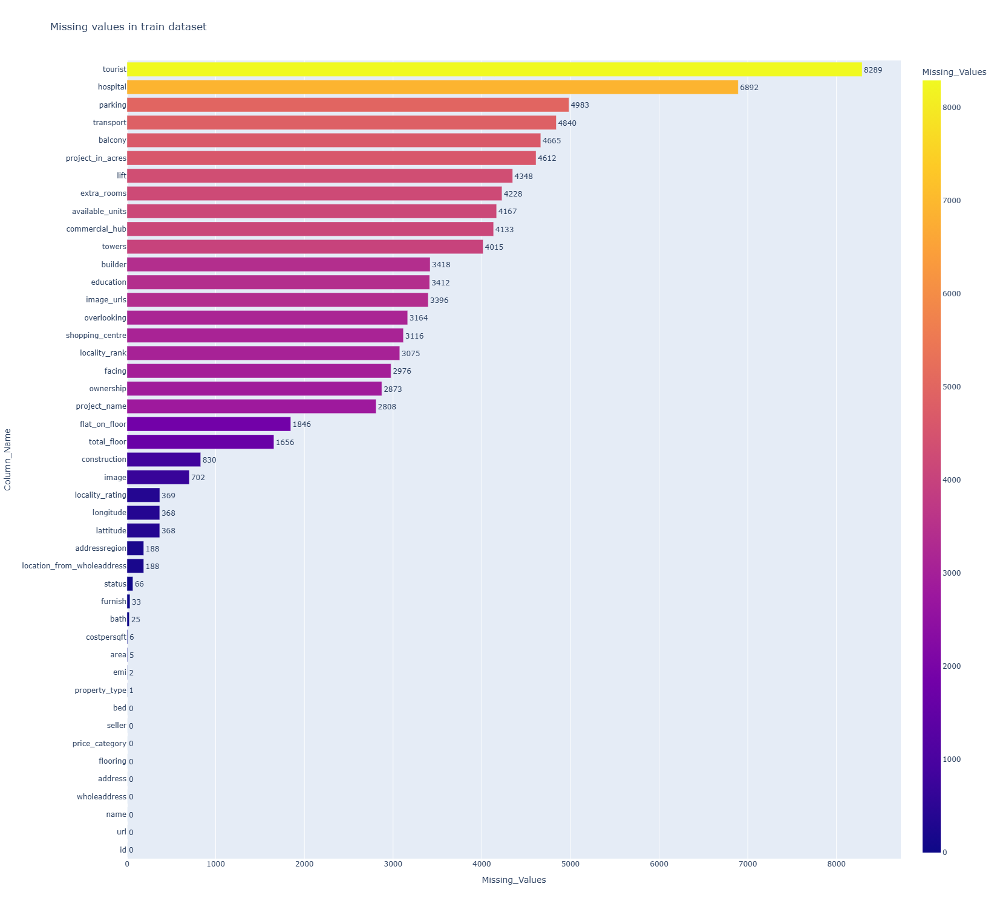

In [18]:
fig = px.bar(temp_X_train.sort_values(by='Missing_Values'),x='Missing_Values',y='Column_Name',
             orientation='h',height=1500,width=1100,color='Missing_Values',text='Missing_Values',title='Missing values in train dataset')
fig.update_traces(textposition='outside')
fig.show()

In [19]:
#First we create a list of missing values by each feature
temp = list(X_test.isna().sum())

#then we create a list of columns and their missing values as inner list to a separate list
lst= []
i=0
for col in X_test.columns:
    insert_lst = [col,temp[i]]
    lst.append(insert_lst)
    i+=1

#finally create a dataframe
temp_X_test = pd.DataFrame(data=lst,columns=['Column_Name','Missing_Values'])

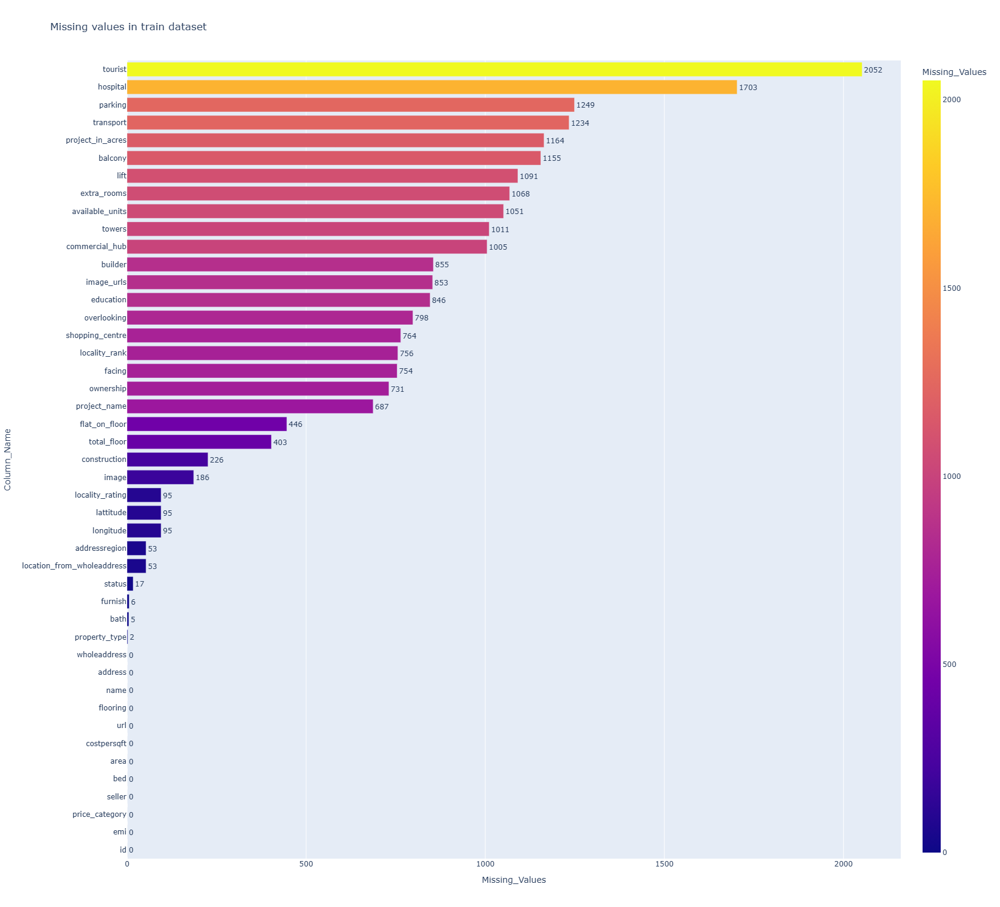

In [20]:
fig = px.bar(temp_X_test.sort_values(by='Missing_Values'),x='Missing_Values',y='Column_Name',
             orientation='h',height=1500,width=1100,color='Missing_Values',text='Missing_Values',title='Missing values in train dataset')
fig.update_traces(textposition='outside')
fig.show()

`observation`
- from X_train data total 36 columns have missing values
- from X_test total 33 columns have missing values 

# Missingo for Missing Values

In [21]:
X_train.shape

(9515, 45)

<Axes: >

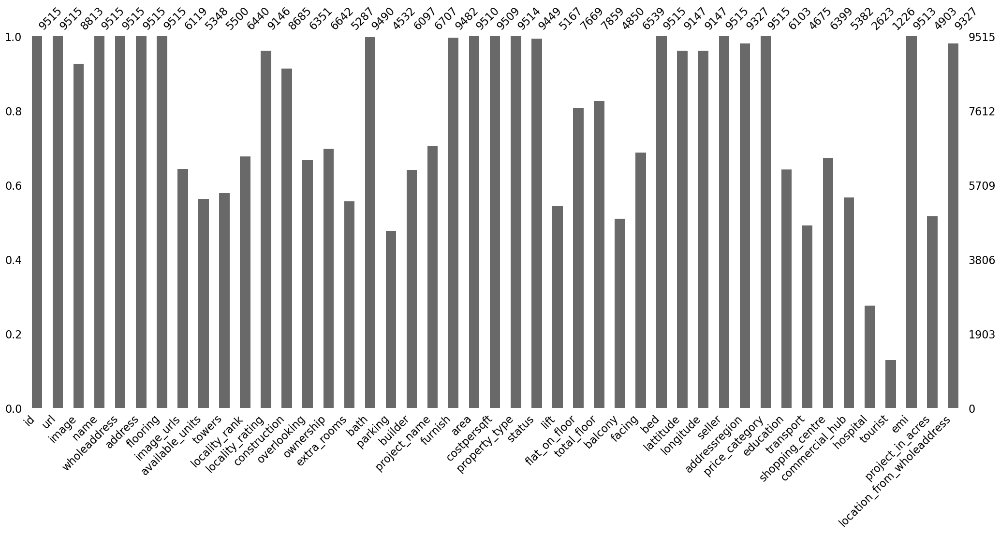

In [22]:
# Bar plot to visualize missing values
msno.bar(X_train)

<Axes: >

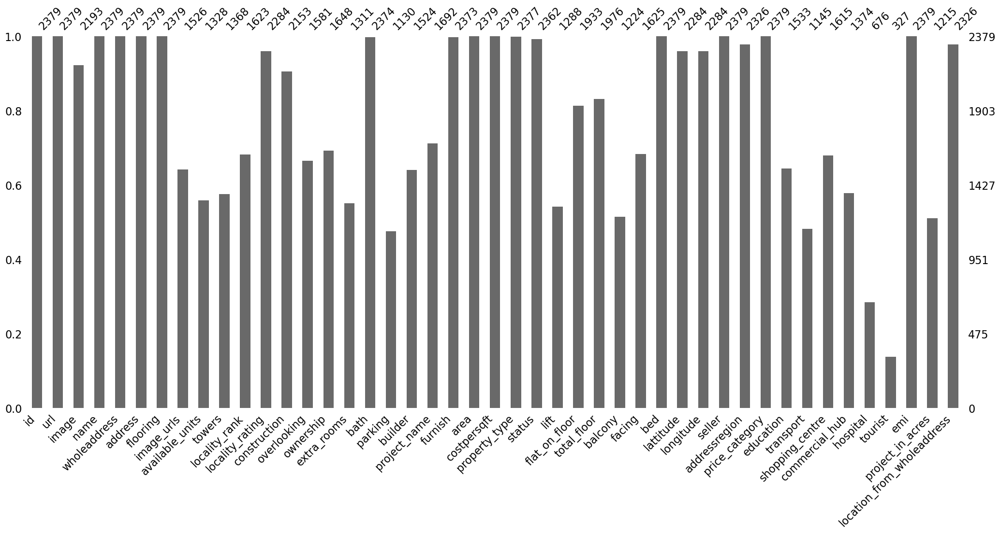

In [23]:
# Bar plot to visualize missing values
msno.bar(X_test)

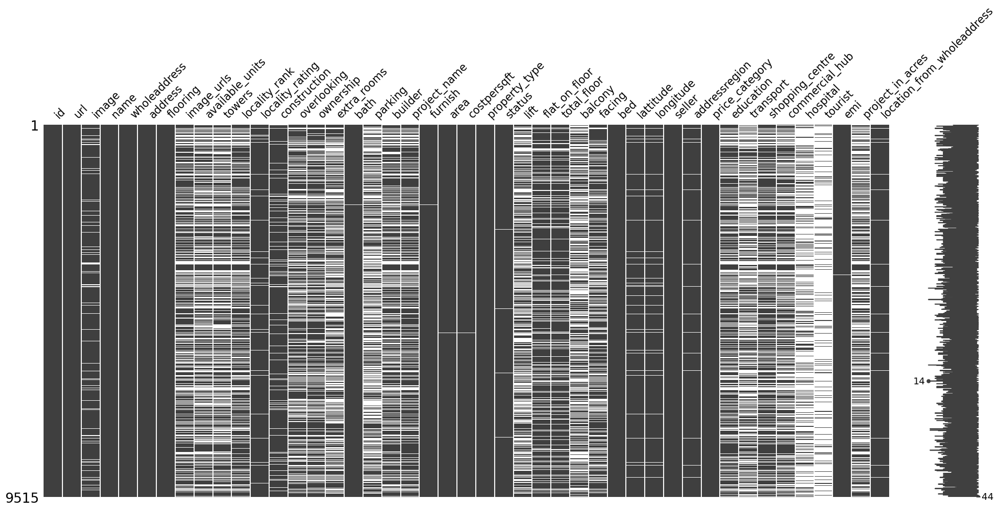

In [24]:
# Matrix chart to visualize missing values
msno.matrix(X_train)
plt.show()

`observation`
- The numbers 44 and 14 show that those rows contain 44 and 14 non-missing values, respectively.
- The white spaces indicate missing values.The black spaces represent present (non-missing) values.
- out of 45 columns 22 columns have major mising values 

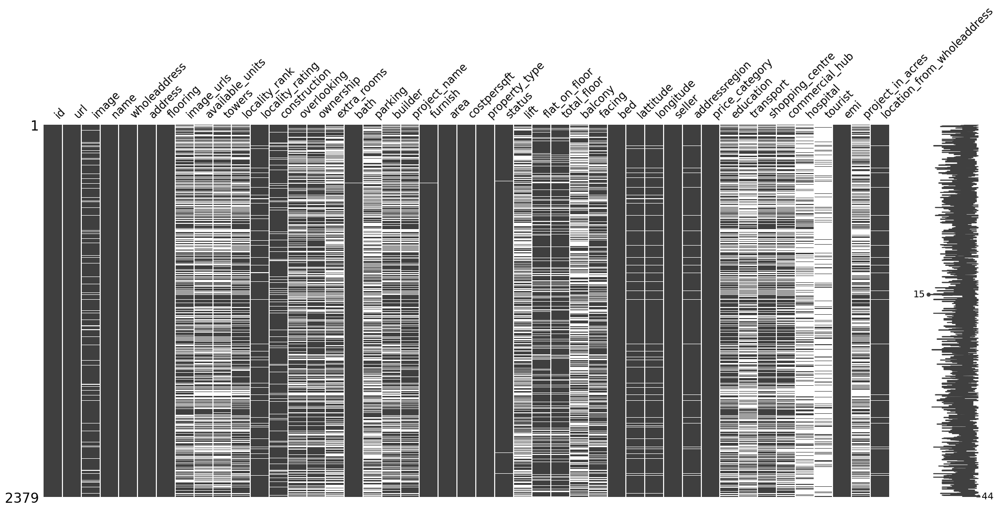

In [25]:
# Matrix chart to visualize missing values
msno.matrix(X_test)
plt.show()

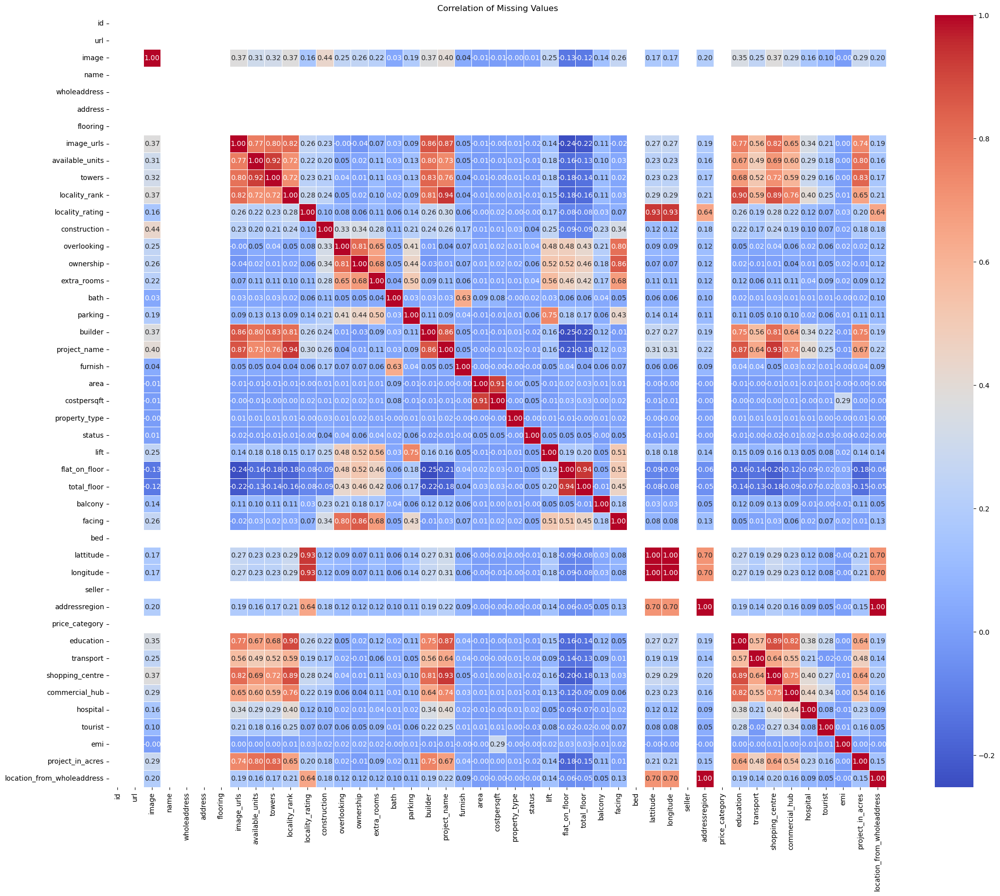

In [26]:
# Compute the missingness correlation
X_train_missing_corr_matrix = X_train.isnull().corr()

plt.figure(figsize=(25,20))
sns.heatmap(X_train_missing_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation of Missing Values")
plt.show()

In [27]:
# Get categorized missing value relationships
missingness_categories = categorize_missingness(X_train_missing_corr_matrix)

# Print results
for category, related_columns in missingness_categories.items():
    print(f"\n{category}:")
    for col, related in related_columns.items():
        print(f"{col}: {', '.join(related)}")


exact 1.00 means always Missing Together:
lattitude: longitude
addressregion: location_from_wholeaddress

less than 1.00 but greater than equal to 0.7 means highly Likely to be Missing Together:
image_urls: available_units, towers, locality_rank, builder, project_name, education, shopping_centre, project_in_acres
available_units: towers, locality_rank, builder, project_name, project_in_acres
towers: locality_rank, builder, project_name, shopping_centre, project_in_acres
locality_rank: builder, project_name, education, shopping_centre, commercial_hub
locality_rating: lattitude, longitude
overlooking: ownership, facing
ownership: facing
parking: lift
builder: project_name, education, shopping_centre, project_in_acres
project_name: education, shopping_centre, commercial_hub
area: costpersqft
flat_on_floor: total_floor
lattitude: addressregion, location_from_wholeaddress
longitude: addressregion, location_from_wholeaddress
education: shopping_centre, commercial_hub
shopping_centre: commer

`observation`
- "Unrelated Missingness" means that the missing values in two columns have no meaningful relationship.

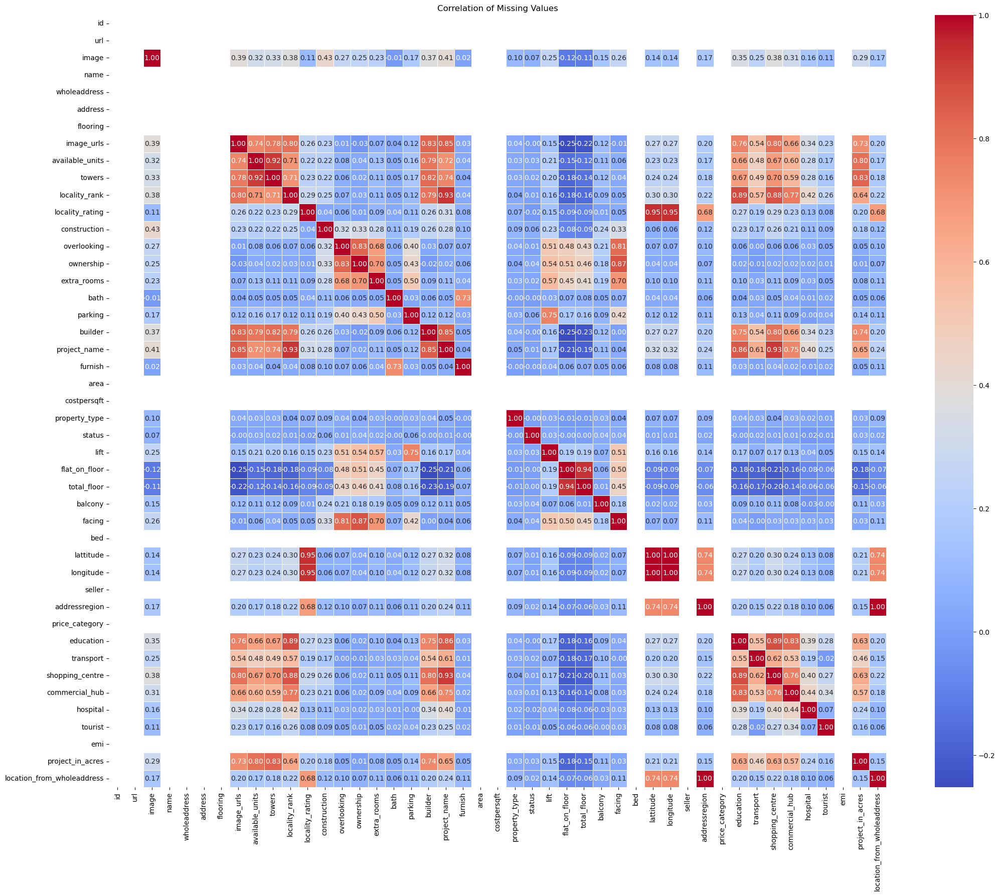

In [28]:
# Compute the missingness correlation
X_test_missing_corr_matrix = X_test.isnull().corr()

plt.figure(figsize=(25,20))
sns.heatmap(X_test_missing_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation of Missing Values")
plt.show()

In [29]:
# Get categorized missing value relationships
missingness_categories = categorize_missingness(X_test_missing_corr_matrix)

# Print results
for category, related_columns in missingness_categories.items():
    print(f"\n{category}:")
    for col, related in related_columns.items():
        print(f"{col}: {', '.join(related)}")


exact 1.00 means always Missing Together:
lattitude: longitude
addressregion: location_from_wholeaddress

less than 1.00 but greater than equal to 0.7 means highly Likely to be Missing Together:
image_urls: available_units, towers, locality_rank, builder, project_name, education, shopping_centre, project_in_acres
available_units: towers, locality_rank, builder, project_name, project_in_acres
towers: locality_rank, builder, project_name, shopping_centre, project_in_acres
locality_rank: builder, project_name, education, shopping_centre, commercial_hub
locality_rating: lattitude, longitude
overlooking: ownership, facing
ownership: facing
extra_rooms: facing
bath: furnish
parking: lift
builder: project_name, education, shopping_centre, project_in_acres
project_name: education, shopping_centre, commercial_hub
flat_on_floor: total_floor
lattitude: addressregion, location_from_wholeaddress
longitude: addressregion, location_from_wholeaddress
education: shopping_centre, commercial_hub
shoppin

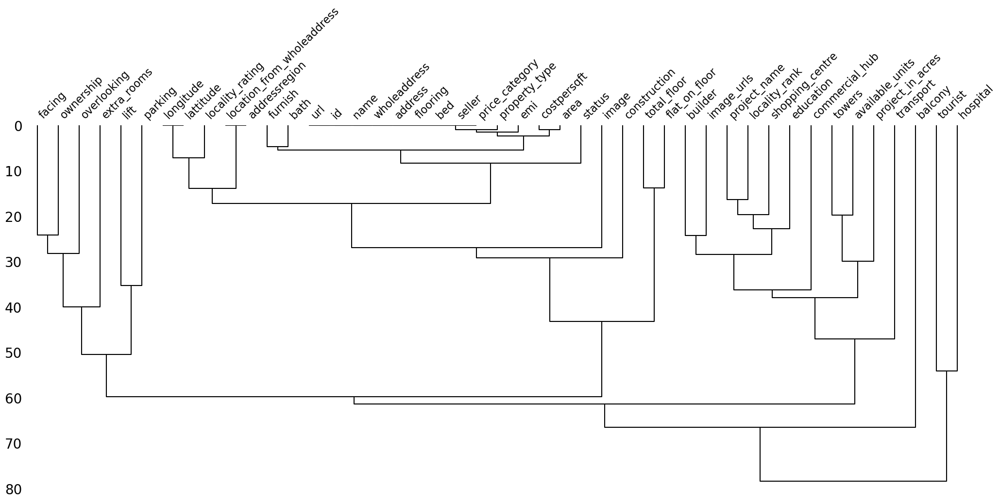

In [30]:
# Dendrogram to visualize the hierarchical clustering of missing values
msno.dendrogram(X_train)
plt.show()

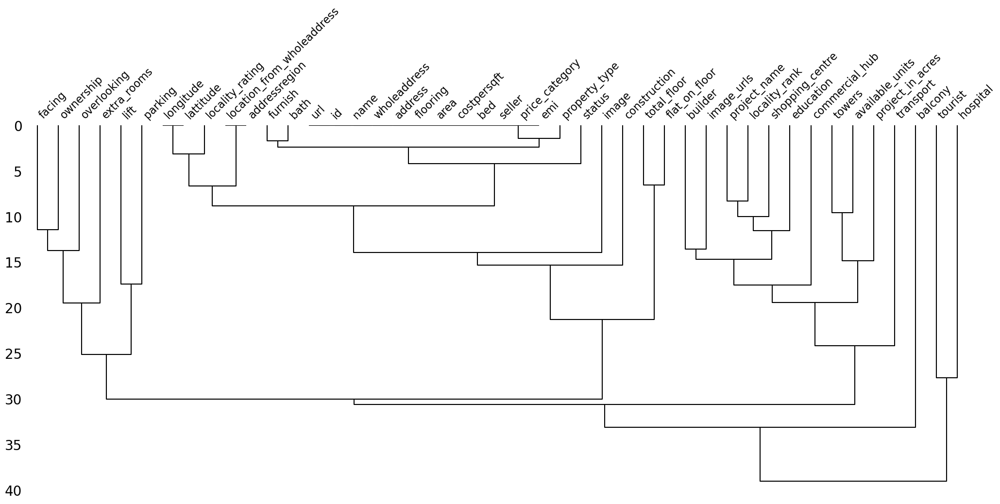

In [31]:
# Dendrogram to visualize the hierarchical clustering of missing values
msno.dendrogram(X_test)
plt.show()

`observation`
- from dendograms we can say that this categorize_missingness function works well 

`notes`  
- **MCAR (Missing Completely at Random):**  
  - Probability of missing data does not depend on observed or unobserved data.  
  - Outcome: If we remove missing values from an MCAR column, the distribution before and after removal remains the same, meaning their absence doesn’t bias the data.  
  - Handling: We can use removal, imputation, or algorithms that handle missing data.
  - Use Little’s MCAR test to statistically verify if data is MCAR.  
- **MAR (Missing at Random):**  
  - Probability of missing data depends on observed data but not on unobserved data.  
  - Handling: Use imputation or algorithms that handle missing values.
  - use KDE plot to detect MAR
- **MNAR (Missing Not at Random):**  
  - Probability of missing data depends on unobserved data, meaning the missingness is related to the actual missing values.  
  - Handling: If we cannot confirm whether data is MCAR or MAR, we assume it could be MNAR.
- **Techniques to Handle Missing Values:**  
  1. Removing: Drop missing values (use only if missingness is small & MCAR).  
  2. Imputation: Fill missing values (various techniques exist).  
  3. Using algorithms that handle missing values natively: E.g., XGBoost, LightGBM.  
  4. Choosing appropriate imputation methods:  
     - Continuous data: Mean, median, regression-based imputation.  
     - Categorical data: Mode, predictive modeling, category-specific imputation.    
- **Key Point:**  
  - Preserve the data distribution before and after handling missing values to avoid bias.
  - If we drop the missing value rows of any column then to check for categorical data we use PMF method 

`observation`
- Drop columns with too many missing values (e.g., >40-50%).
- Since columns are MCAR with <5% missing data, removing rows won’t bias the distribution, making it an acceptable choice over imputation.
- so in X_train data 11 columns have more than 40% missing values 
- so I wont drop them yet as I plan to create a new features from them

`observation`  
Missing Value Analysis

- use Little’s MCAR test to distinguish between MAR, MCAR, and MNAR.
- Use correlation analysis to check if missing values are dependent on other features (MAR).
- For MNAR, check if missingness correlates with the target variable.

In [32]:
df.columns

Index(['id', 'url', 'image', 'name', 'wholeaddress', 'address', 'flooring',
       'image_urls', 'available_units', 'towers', 'locality_rank',
       'locality_rating', 'construction', 'overlooking', 'ownership',
       'extra_rooms', 'bath', 'parking', 'builder', 'project_name', 'furnish',
       'price', 'area', 'costpersqft', 'property_type', 'status', 'lift',
       'flat_on_floor', 'total_floor', 'balcony', 'facing', 'bed', 'lattitude',
       'longitude', 'seller', 'addressregion', 'price_category', 'education',
       'transport', 'shopping_centre', 'commercial_hub', 'hospital', 'tourist',
       'emi', 'project_in_acres', 'location_from_wholeaddress'],
      dtype='object')

`observation`
- work on the above numerical features 1st 

In [33]:
#find the numerical columns
numerical_columns = X_train.select_dtypes(include=['number']).columns
print(numerical_columns)
print("-"*100)
print(f'total numerical columns : {len(numerical_columns)}')

Index(['available_units', 'towers', 'locality_rank', 'locality_rating', 'bath',
       'parking', 'area', 'costpersqft', 'lift', 'flat_on_floor',
       'total_floor', 'balcony', 'bed', 'lattitude', 'longitude', 'emi',
       'project_in_acres'],
      dtype='object')
----------------------------------------------------------------------------------------------------
total numerical columns : 17


`t-tests on specific variables test`  
only did here for numerical columns 

In [34]:
# Analyze column
analyze_missing_column(X_train, 'balcony')

Means with 'balcony' missing:
 available_units       409.834596
towers                  4.074241
locality_rank         131.253169
locality_rating         3.814065
bath                    2.135904
parking                 1.258761
area                  762.935221
costpersqft         28826.075723
lift                    2.989644
flat_on_floor           9.779804
total_floor            20.304089
balcony                      NaN
bed                     1.980493
lattitude              19.153426
longitude              72.884245
emi                     1.093170
project_in_acres       39.920024
dtype: float64

Means without 'balcony' missing:
 available_units       513.118439
towers                  5.032332
locality_rank         115.546436
locality_rating         3.706741
bath                    2.473901
parking                 1.501837
area                  984.722772
costpersqft         27893.443204
lift                    3.218307
flat_on_floor          11.840050
total_floor            23.92

In [35]:
# Analyze parking column with 4 predictor variables
analyze_missing_column_with_predictors(X_train, 'balcony', ['costpersqft', 'area', 'bath', 'parking'])



T-test for costpersqft:
T-statistic: 0.7853954891426991, P-value: 0.4322581307255948
costpersqft is NOT significantly different, so 'balcony' is likely MCAR.

T-test for area:
T-statistic: -15.369174480898735, P-value: 1.6110679377417612e-52
area is significantly different between missing and non-missing groups of 'balcony', so 'balcony' is likely MAR.

T-test for bath:
T-statistic: -17.634431462585148, P-value: 1.7140244446296643e-68
bath is significantly different between missing and non-missing groups of 'balcony', so 'balcony' is likely MAR.

T-test for parking:
T-statistic: -11.658641831786504, P-value: 5.815452247231677e-31
parking is significantly different between missing and non-missing groups of 'balcony', so 'balcony' is likely MAR.


`observation`
- If a column is MCAR, removing rows with NaNs does not affect other columns' distributions.But if another column is MAR, removing those rows can bias its distribution.
- Little’s MCAR test provides a global assessment of missingness across all numerical features, whereas t-tests only compare specific variables, making Little’s test more comprehensive. hence further go with only Little MCAR test
- have only done it on numerical columns; for categorical columns, still need to work.

`Little’s MCAR Test`  
only did here for numerical columns 

In [36]:
# Run Little’s MCAR test only on numerical features
chi_square, p_value = littles_mcar_test(X_train)
print(f"Chi-Square: {chi_square}, p-value: {p_value}")

if p_value > 0.05:
    print("Fail to reject MCAR hypothesis → Data is MCAR.")
else:
    print("Reject MCAR hypothesis → Data is not MCAR, so it can be MAR or MNAR.")


Chi-Square: 58190.23339311148, p-value: 0.0
Reject MCAR hypothesis → Data is not MCAR, so it can be MAR or MNAR.


`observation`
- A rejection of the MCAR hypothesis means that at least one or more numerical columns have missing values that are not missing completely at random—but this does not necessarily mean all columns are MAR or MNAR.
- have only done it on numerical columns; for categorical columns, still need to work.

`Predictive Modeling for Missingness`

In [37]:
# Create missing indicator for 'area'
df['area_missing'] = df['area'].isnull().astype(int)

# Select only numerical columns
num_features = df.select_dtypes(include=['number']).columns.tolist()

# Drop 'area', 'price', and 'area_missing' from features
drop_cols = ['area', 'price', 'area_missing']
X_new = df[num_features].drop(columns=drop_cols)
y_new = df['area_missing']

# Split the data
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new, test_size=0.3, random_state=42)

# Impute missing values
imputer = SimpleImputer(strategy='median')
X_train_new = imputer.fit_transform(X_train_new)
X_test_new = imputer.transform(X_test_new)

# Fit the logistic regression model
model = LogisticRegression()
model.fit(X_train_new, y_train_new)

# Evaluate the model
predictions = model.predict(X_test_new)
print(classification_report(y_test_new, predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3567
           1       0.00      0.00      0.00         2

    accuracy                           1.00      3569
   macro avg       0.50      0.50      0.50      3569
weighted avg       1.00      1.00      1.00      3569



In [38]:
model.coef_

array([[ 6.93855588e-04, -2.76375644e-01, -7.42082510e-03,
         4.53567257e-03,  1.02622917e-01,  6.67784651e-02,
        -2.92974870e-05,  5.30094024e-03, -2.01746382e-01,
         4.42344203e-02, -3.89809107e-02,  7.64932684e-02,
        -8.29173062e-02, -5.14949834e-02,  1.53150724e-01,
        -2.02707942e-01]])

`observation`
- Accuracy: 65% → Model is moderately good at predicting missing parking.
- Recall for 1 (missing) is 0.81 → Better at detecting missing values.
- Recall for 0 (not missing) is 0.47 → Struggles to detect non-missing values.
- Since accuracy is not perfect,X_new only partially explains missingness → Parking is partially MAR.
- Low accuracy suggests some missingness might be MNAR.
- If any feature had a large positive or negative coefficient, it would mean parking missingness strongly depends on that feature. but as Small coefficients (-0.02 to 0.01) → No strong influence from features.
- Weak relationship between parking missingness and X_new.
- unclear whether the missingness MAR or MNAR.

`conclusion`
- all numerical column checked and for all numerical columns unclear whether the missingness MAR or MNAR.
- both test `t-tests on specific variables test` and `Little’s MCAR Test` fail to detect the MAR,MCAR and MNAR columns
- and we have work only on numerical columns till now using both this test , categorical columns are still pending

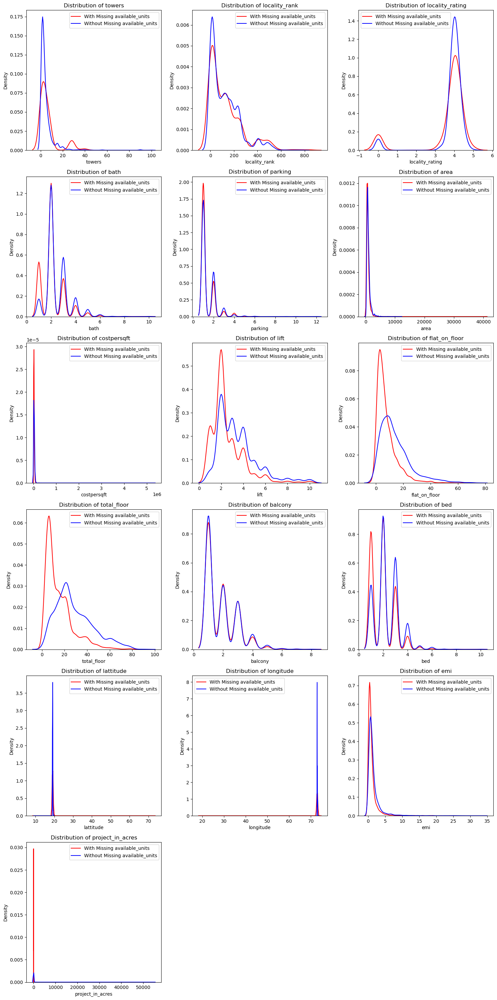

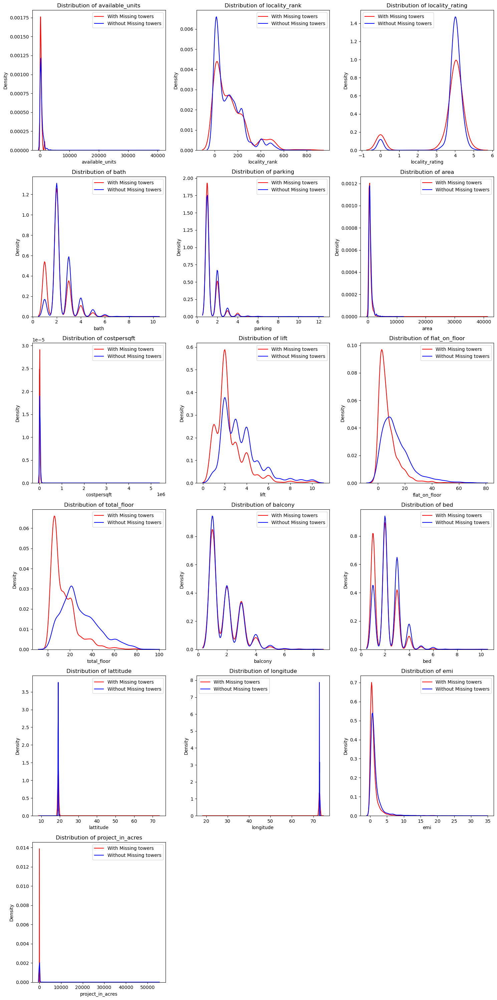

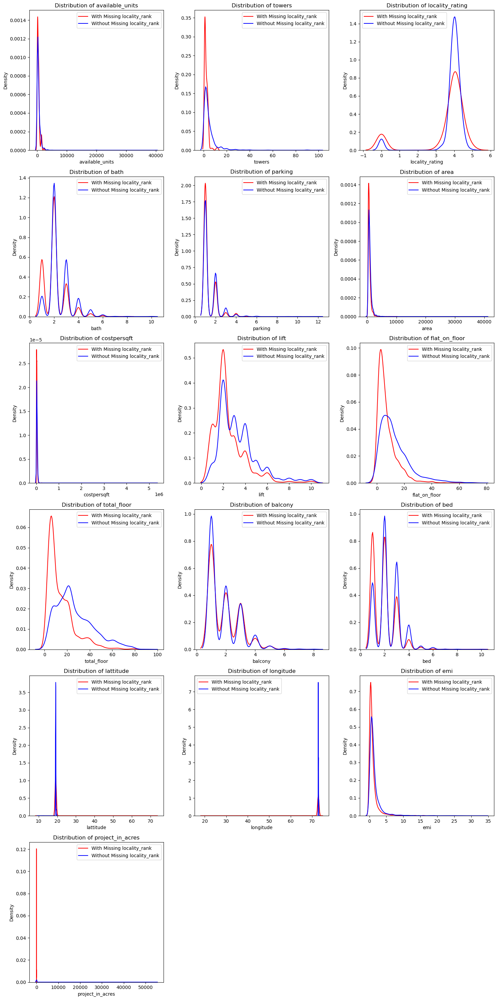

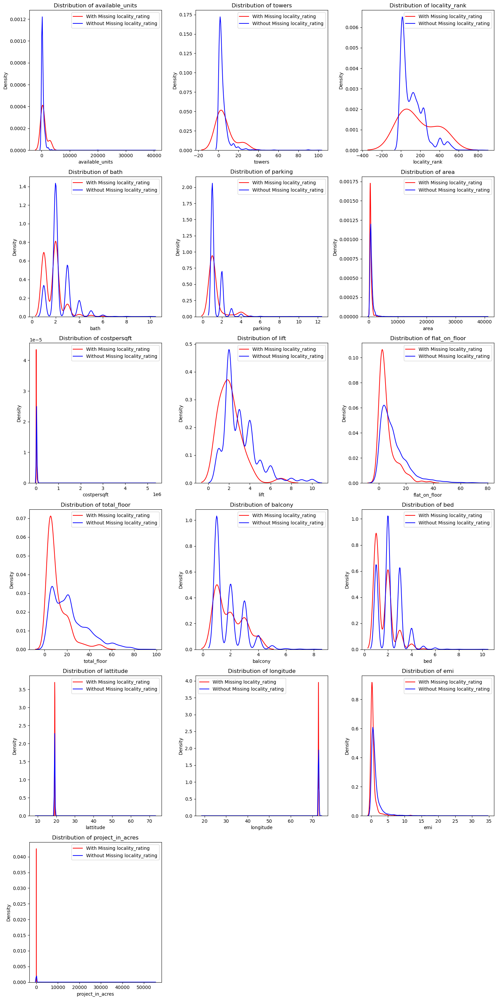

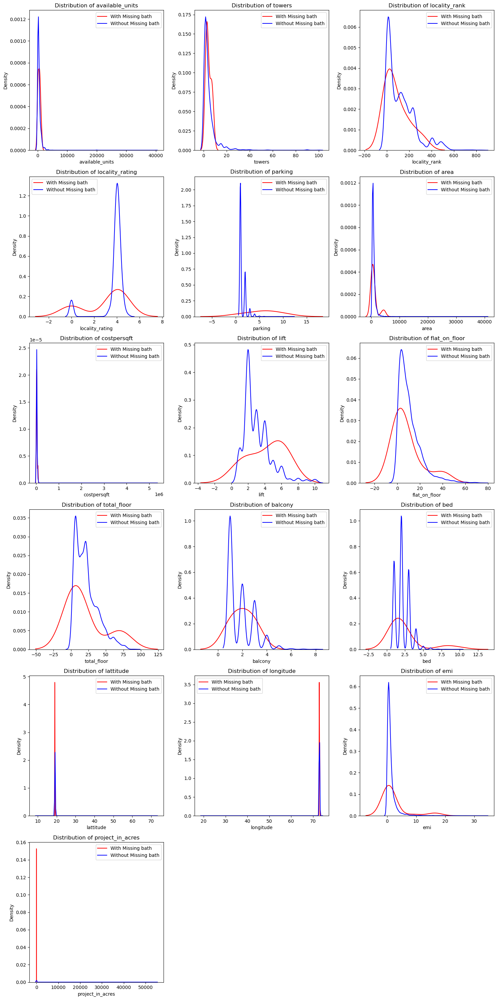

...

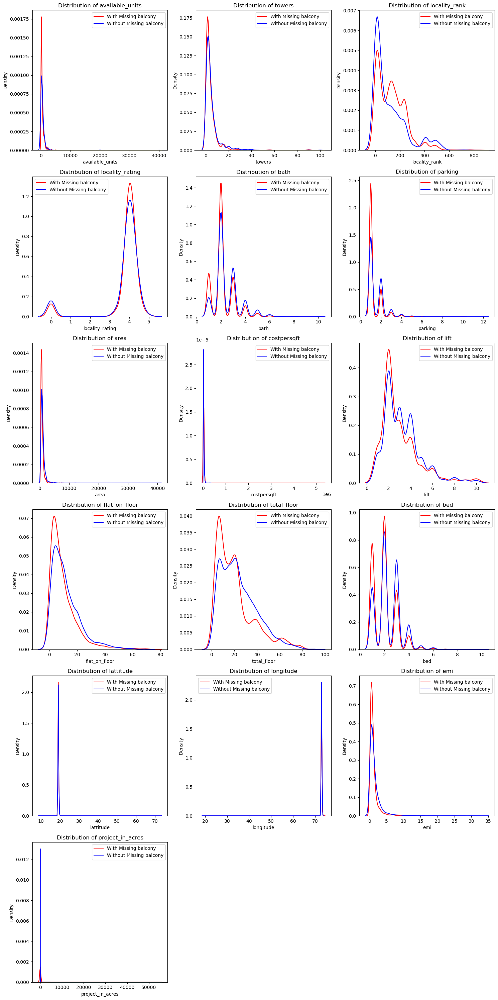

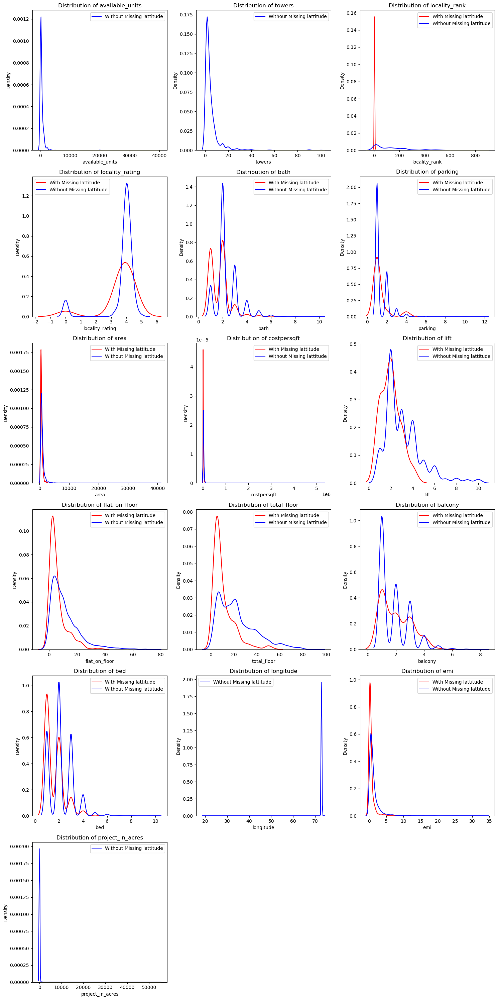

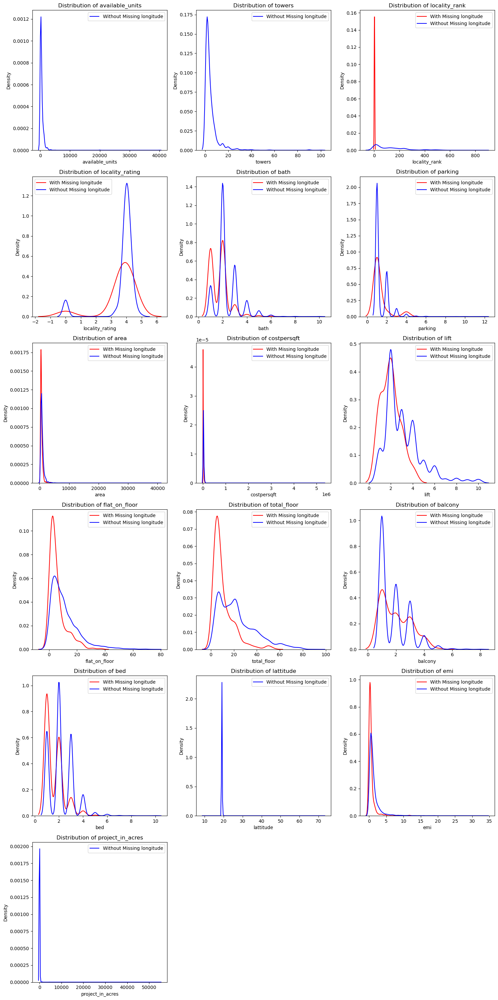

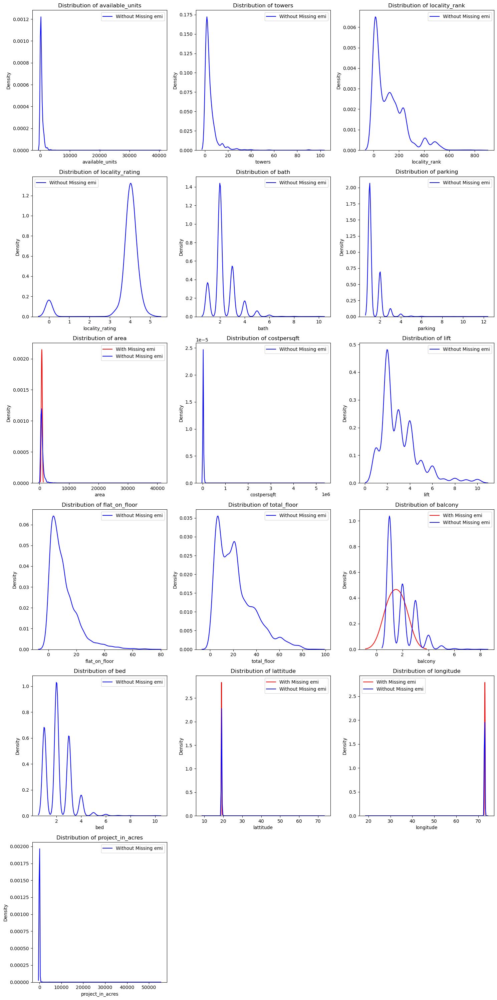

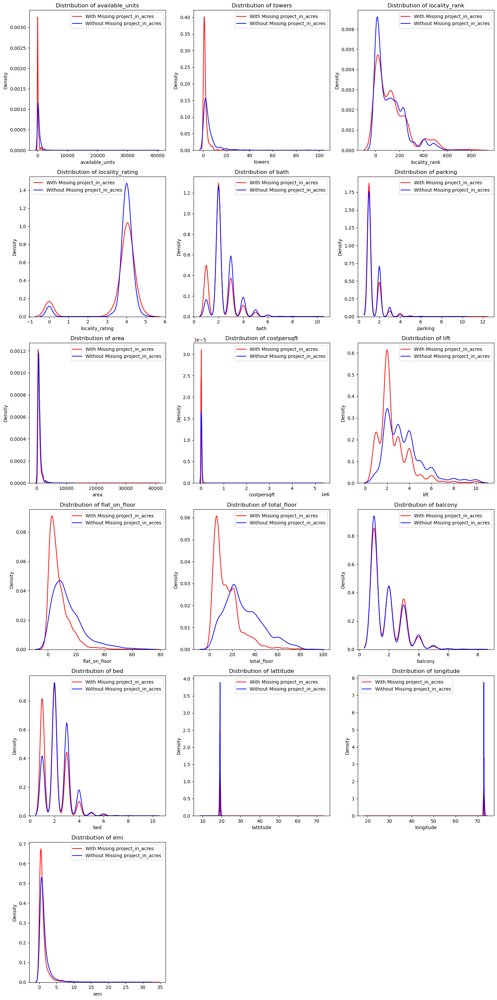

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Select only numeric columns
numeric_features = X_train.select_dtypes(include=['number']).columns

# Iterate over each numeric column as Feature1 (the column with missing values)
for feature1 in numeric_features:
    if X_train[feature1].isnull().sum() > 0:  # Process only if feature1 has missing values
        group_with_missing = X_train[X_train[feature1].isnull()]
        group_without_missing = X_train[~X_train[feature1].isnull()]

        # Get the numeric features excluding feature1
        other_features = [feature for feature in numeric_features if feature != feature1]
        
        # Define grid size
        num_features = len(other_features)
        num_cols = 3  # Number of columns in the grid
        num_rows = int(np.ceil(num_features / num_cols))  # Calculate required rows

        fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 5 * num_rows))
        axes = axes.flatten()  # Flatten to easily iterate

        for i, feature2 in enumerate(other_features):
            sns.kdeplot(group_with_missing[feature2].dropna(), color='red', label=f'With Missing {feature1}', common_norm=False, ax=axes[i])
            sns.kdeplot(group_without_missing[feature2].dropna(), color='blue', label=f'Without Missing {feature1}', common_norm=False, ax=axes[i])
            axes[i].set_title(f'Distribution of {feature2}')
            axes[i].legend()

        # Hide unused subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()


`observation`
- graphs affected because of removing the outliers and graphs not affected by removing the outliers, both graphs are present for each feature and hence its hard to detect MAR from kde plot also 

Observation  
- Till now, all techniques have failed. Now, let's fill the missing values:  
  - Univariate Imputation: In this technique, we use the same column to fill its missing values.
      - means suppose age has missing vlaues so we take the help of the same age column values only to fill the missing values of age column
      - for univariate use 2 sklearn class
          - 1)sklearn Missing indicator
          - 2)sklearn simple imputer
  - Multivariate Imputation: In this technique, we use other columns to fill the missing values.
      - so suppose we have f1,f2,f3 column then to fill the f2 column missing values we take the help of the f1 and f3 columnmputer

use this below codes later

In [40]:
# compute the mode for the education column within each addressregion 
mode_education = (
    X_train.groupby("addressregion")["education"]
    .agg(lambda x: x.mode().iloc[0] if not x.mode().empty else None)
)

print(mode_education)

addressregion
abhyudaya nagar                 guru govind singh school and college parel(1.1...
adai navi mumbai                                                             None
adarsh housing society          pillai college of engineering(1.1 km), kendriy...
adarsh nagar jogeshwari west    sp jain institute of management research(1.9 k...
adarsh nagar malad west         veer bhagat singh vidyalaya(0.4 km), rajiv gan...
                                                      ...                        
yamuna nagar andheri west       sp jain institute of management research(1.9 k...
yari road                       rajiv gandhi institute of technology(2.4 km), ...
yashodhan nagar                                                              None
yogi hills                      lokhandwala foundation school(7.6 km), thakur ...
yogi nagar                                                                   None
Name: education, Length: 824, dtype: object


In [41]:
# It fills missing values in the 'education' column with the most frequent value (mode) within each 'addressregion' group; if no mode exists, it assigns "Unknown".
X_train['education'] = X_train.groupby('addressregion')['education'].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))